# Case study of a cyclogenesis over East Asia
- 12 UTC 10 Feb 2011 - 12 UTC 12 Feb 2011
- Total amount of snowfall in Yeongdong 100.8 cm

## Compute the absolute vorticity at 500 hPa

In [1]:
import numpy as np
from netCDF4 import Dataset, num2date

In [2]:
start, end   = "2011021012", "2011021212"
llLon, urLon = 110., 145.
llLat, urLat = 25., 50.

In [3]:
ncRelVor = Dataset("./DATA/ERA5/vo500.nc", "r")

ncTs     = ncRelVor.variables["time"][:].data
ncTUnit  = ncRelVor.variables["time"].units
ncTCal   = ncRelVor.variables["time"].calendar
ncTs     = np.array([ncT.strftime("%Y%m%d%H") for ncT in num2date(ncTs, ncTUnit, calendar = ncTCal)], dtype = str)

ncLats   = ncRelVor.variables["latitude"][:].data
ncLons   = ncRelVor.variables["longitude"][:].data

In [4]:
relVor = ncRelVor.variables["vo"][np.where(ncTs == start)[0][0] : np.where(ncTs == end)[0][0] + 1,\
                                  np.where((ncLats >= llLat) & (ncLats <= urLat))[0],\
                                  np.where((ncLons >= llLon) & (ncLons <= urLon))[0]].data

times = ncTs[np.where(ncTs == start)[0][0] : np.where(ncTs == end)[0][0] + 1]
lats  = ncLats[np.where((ncLats >= llLat) & (ncLats <= urLat))[0]]
lons  = ncLons[np.where((ncLons >= llLon) & (ncLons <= urLon))[0]]

meshLons, meshLats = np.meshgrid(lons, lats)

In [5]:
absVor = np.full(relVor.shape, np.nan, dtype = float)

for t, time in enumerate(times):
    w = 7.2921e-5
    f = 2. * w * np.sin(meshLats * 2. * np.pi / 360.)
    absVor[t] = relVor[t] + f

absVor /= 1e-5

## Make a plot for 500-hPa isobaric charts with geopotential height (contour) and absolute vorticity (shading)

In [6]:
import warnings
warnings.filterwarnings(action = "ignore")
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mgimg
from tqdm import tqdm
from matplotlib.animation import ArtistAnimation
from mpl_toolkits.basemap import Basemap

In [7]:
ncZ500 = Dataset("./DATA/ERA5/z500.nc", "r")

Z500 = ncZ500.variables["z"][np.where(ncTs == start)[0][0] : np.where(ncTs == end)[0][0] + 1,\
                             np.where((ncLats >= llLat) & (ncLats <= urLat))[0],\
                             np.where((ncLons >= llLon) & (ncLons <= urLon))[0]].data
Z500 /= 9.8

100%|██████████| 49/49 [00:58<00:00,  1.19s/it]


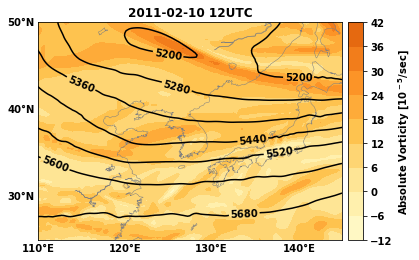

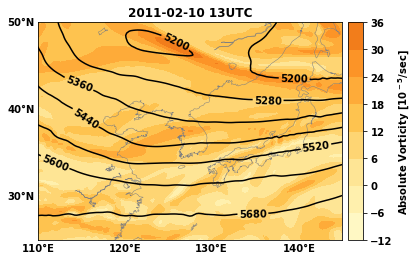

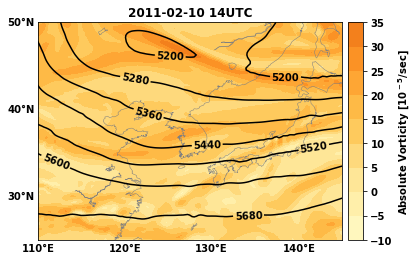

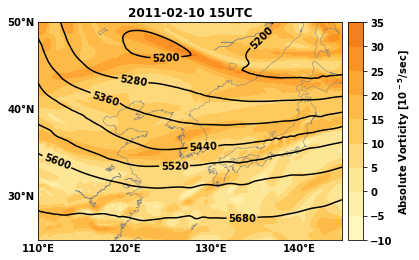

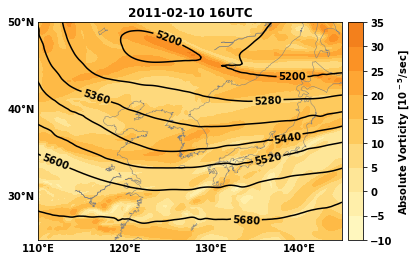

...

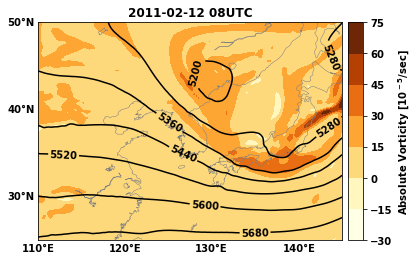

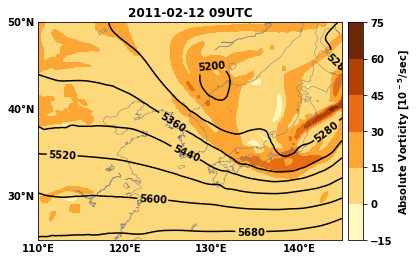

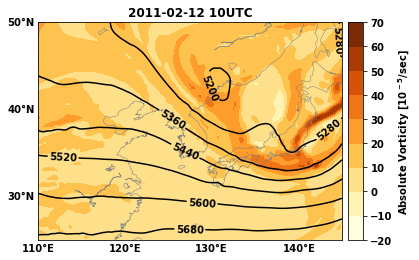

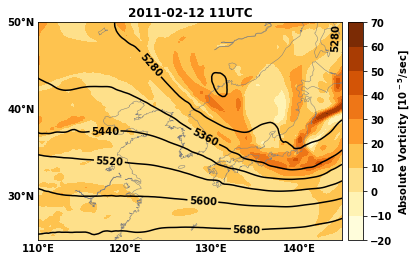

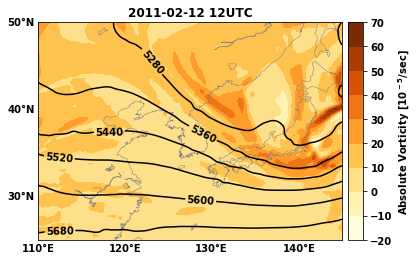

In [24]:
for t, time in tqdm(enumerate(times), total = len(times)):
    fig, sub = plt.subplots()

    m = Basemap(llcrnrlon = llLon, urcrnrlon = urLon, llcrnrlat = llLat, urcrnrlat = urLat, resolution = "l", ax = sub)
    _ = m.drawcoastlines(linewidth = 0.5, color = "grey")
    _ = m.drawparallels(np.arange(0.,  90., 10.), labels = [1, 0, 0, 0], linewidth = 0.)
    _ = m.drawmeridians(np.arange(0., 180., 10.), labels = [0, 0, 0, 1], linewidth = 0.)
    
    x, y = m(meshLons, meshLats)
    
    plotZ500  = m.contour(x, y, Z500[t], colors = "k", linewidth = 1.)
    labelZ500 = sub.clabel(plotZ500, inline = 1, fmt = "%i")
    
    plotAbsVor = m.contourf(x, y, absVor[t], cmap = "YlOrBr", norm = mpl.colors.Normalize(vmin = absVor.min(), vmax = absVor.max()))
    cbar = m.colorbar(plotAbsVor, location = "right", label = r"Absolute Vorticity [10$^{-5}$/sec]")
    
    sub.set_title("%s-%s-%s %sUTC" % (time[: 4], time[4 : 6], time[6 : 8], time[8 :]))
    
    plt.savefig("./1/%s.png" % time, dpi = 1000, bbox_inches = "tight")

100%|██████████| 49/49 [00:10<00:00,  4.65it/s]
MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


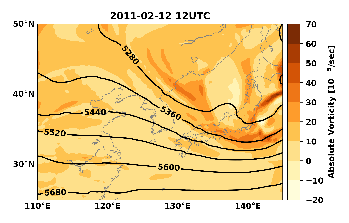

In [32]:
fig, sub = plt.subplots()
sub.axis("off")

figs = []

for time in tqdm(times, total = len(times)):
    imgplot = plt.imshow(mgimg.imread("./1/%s.png" % time))
    figs.append([imgplot])

anim = ArtistAnimation(fig, figs, interval = 500, blit = True, repeat_delay = 2000)
anim.save("./1/1.gif", fps = 4, dpi = 1000)

## Compute the 1000-500 hPa thickness

In [8]:
ncZ1000 = Dataset("./DATA/ERA5/z1000.nc", "r")

Z1000 = ncZ1000.variables["z"][np.where(ncTs == start)[0][0] : np.where(ncTs == end)[0][0] + 1,\
                               np.where((ncLats >= llLat) & (ncLats <= urLat))[0],\
                               np.where((ncLons >= llLon) & (ncLons <= urLon))[0]].data
Z1000 /= 9.8

thick = Z500 - Z1000

## Make a plot for the thickness charts with 1000-hPa geopotential height (contour) and the 1000-500 hPa thickness (color contour)

100%|██████████| 49/49 [02:17<00:00,  2.80s/it]


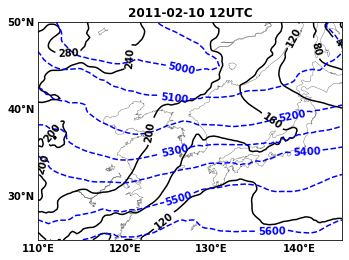

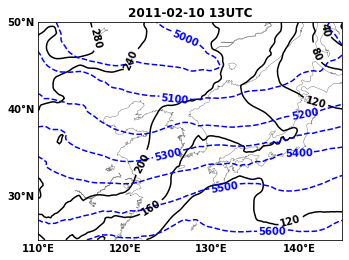

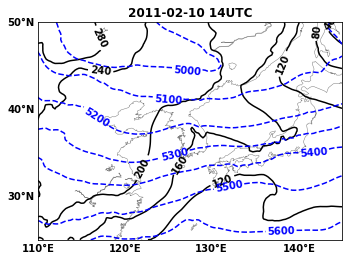

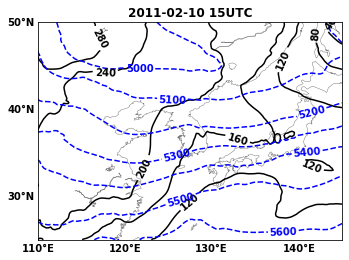

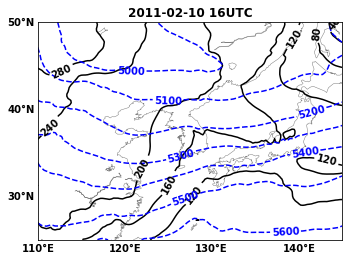

...

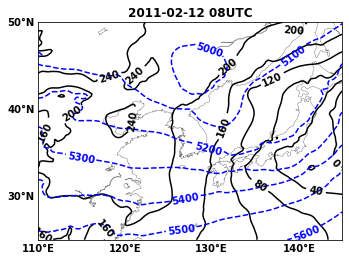

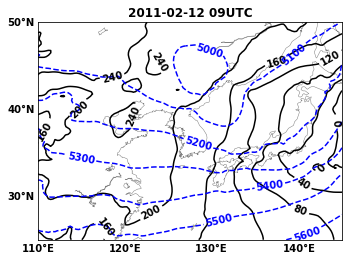

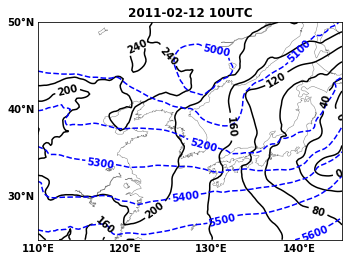

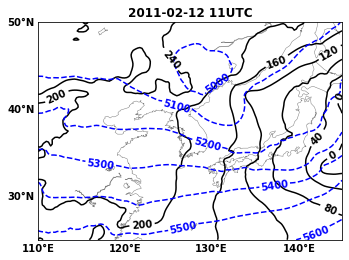

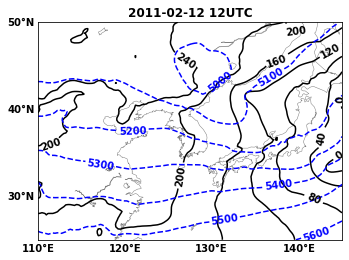

In [35]:
for t, time in tqdm(enumerate(times), total = len(times)):
    fig, sub = plt.subplots()

    m = Basemap(llcrnrlon = llLon, urcrnrlon = urLon, llcrnrlat = llLat, urcrnrlat = urLat, resolution = "l", ax = sub)
    _ = m.drawcoastlines(linewidth = 0.5, color = "grey")
    _ = m.drawparallels(np.arange(0.,  90., 10.), labels = [1, 0, 0, 0], linewidth = 0.)
    _ = m.drawmeridians(np.arange(0., 180., 10.), labels = [0, 0, 0, 1], linewidth = 0.)
    
    x, y = m(meshLons, meshLats)
    
    plotZ1000  = m.contour(x, y, Z1000[t], colors = "k", linewidth = 1.)
    labelZ1000 = sub.clabel(plotZ1000, inline = 1, fmt = "%i")
    
    plotThick = m.contour(x, y, thick[t], colors = "b", linewidth = 1., linestyles = "dashed")
    labelThick = sub.clabel(plotThick, inline = 1, fmt = "%i")
    
    sub.set_title("%s-%s-%s %sUTC" % (time[: 4], time[4 : 6], time[6 : 8], time[8 :]))
    
    plt.savefig("./2/%s.png" % time, dpi = 1000, bbox_inches = "tight")

100%|██████████| 49/49 [00:42<00:00,  1.15it/s]
MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


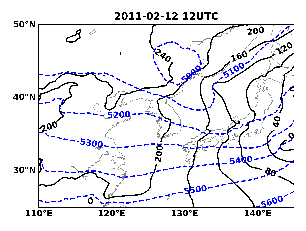

In [37]:
fig, sub = plt.subplots()
sub.axis("off")

figs = []

for time in tqdm(times, total = len(times)):
    imgplot = plt.imshow(mgimg.imread("./2/%s.png" % time))
    figs.append([imgplot])

anim = ArtistAnimation(fig, figs, interval = 500, blit = True, repeat_delay = 2000)
anim.save("./2/2.gif", fps = 4, dpi = 1000)

## Compute Q-vector fields at 850, 700, and 500 hPa levels

In [9]:
import pint
import metpy.calc as mpcalc
from metpy.units import units

In [12]:
def qVector(level, ncTs, ncLats, ncLons, start, end, llLat, urLat, llLon, urLon):
    nc = Dataset("./DATA/ERA5/tuv%i.nc" % level, "r")
    
    times = ncTs[np.where(ncTs == start)[0][0] : np.where(ncTs == end)[0][0] + 1]
    lats  = ncLats[np.where((ncLats >= llLat) & (ncLats <= urLat))[0]]
    lons  = ncLons[np.where((ncLons >= llLon) & (ncLons <= urLon))[0]]
    
    t = nc.variables["t"][np.where(ncTs == start)[0][0] : np.where(ncTs == end)[0][0] + 1,\
                          np.where((ncLats >= llLat) & (ncLats <= urLat))[0],\
                          np.where((ncLons >= llLon) & (ncLons <= urLon))[0]].data
    u = nc.variables["u"][np.where(ncTs == start)[0][0] : np.where(ncTs == end)[0][0] + 1,\
                          np.where((ncLats >= llLat) & (ncLats <= urLat))[0],\
                          np.where((ncLons >= llLon) & (ncLons <= urLon))[0]].data
    v = nc.variables["v"][np.where(ncTs == start)[0][0] : np.where(ncTs == end)[0][0] + 1,\
                          np.where((ncLats >= llLat) & (ncLats <= urLat))[0],\
                          np.where((ncLons >= llLon) & (ncLons <= urLon))[0]].data
    
    qU = np.full(t.shape, np.nan, dtype = float)
    qV = np.full(t.shape, np.nan, dtype = float)
    
    dx, dy = mpcalc.lat_lon_grid_deltas(lons * units.degree_east, lats * units.degree_north)
    
    for tt, time in tqdm(enumerate(times), total = len(times), desc = str(level)):   
        qU[tt], qV[tt] = mpcalc.q_vector(u[tt] * units.meter_per_second,\
                                         v[tt] * units.meter_per_second,\
                                         t[tt] * units.kelvin,\
                                         level * units.hPa, dx, dy)
        
    return qU, qV

In [14]:
llLon, urLon = 110., 145.
llLat, urLat = 25., 50.

qU850, qV850 = qVector(850, ncTs, ncLats, ncLons, start, end, llLat, urLat, llLon, urLon)
qU700, qV700 = qVector(700, ncTs, ncLats, ncLons, start, end, llLat, urLat, llLon, urLon)
qU500, qV500 = qVector(500, ncTs, ncLats, ncLons, start, end, llLat, urLat, llLon, urLon)

500: 100%|██████████| 49/49 [00:00<00:00, 125.30it/s]


## Draw Q-vector fields at 850, 700, and 500 hPa levels

100%|██████████| 49/49 [04:14<00:00,  5.20s/it]


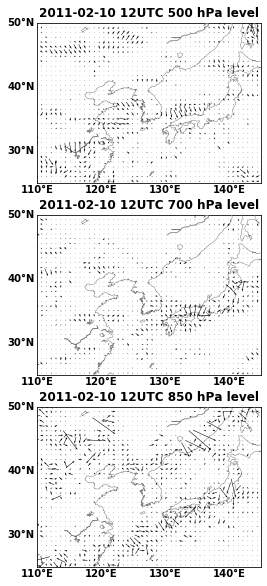

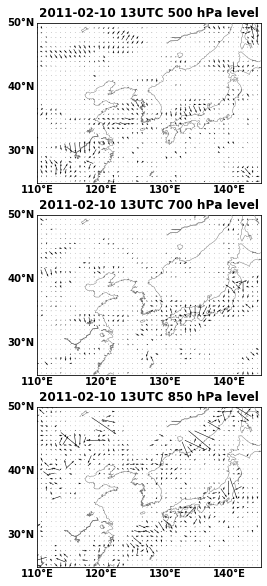

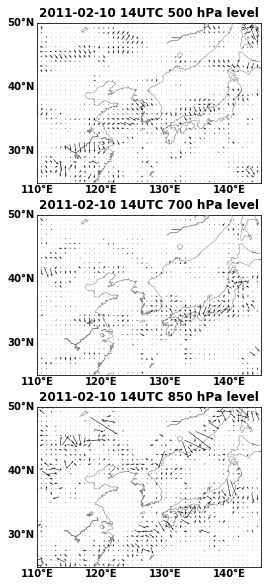

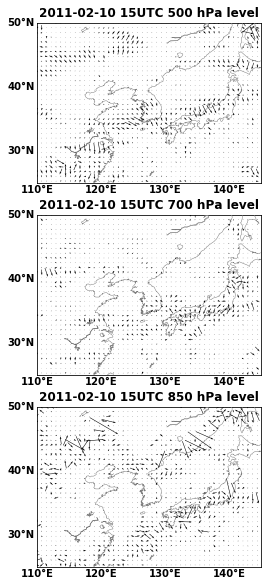

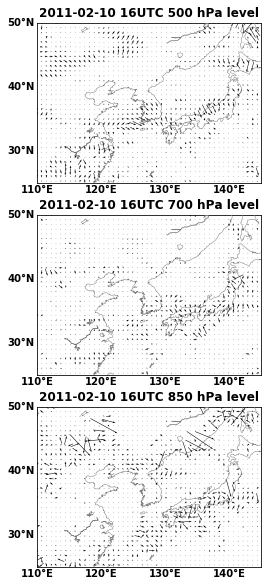

...

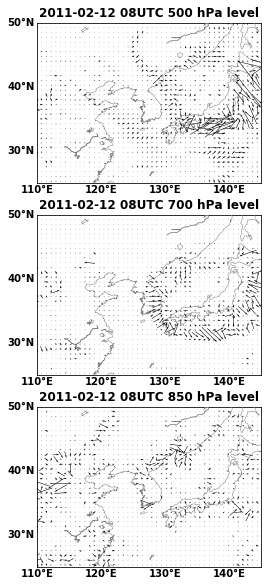

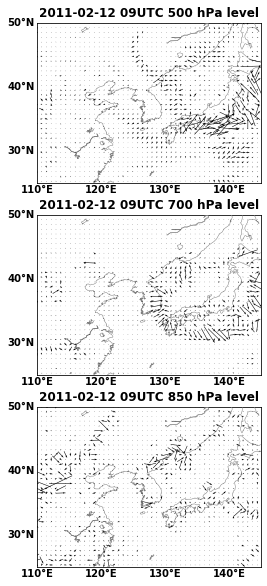

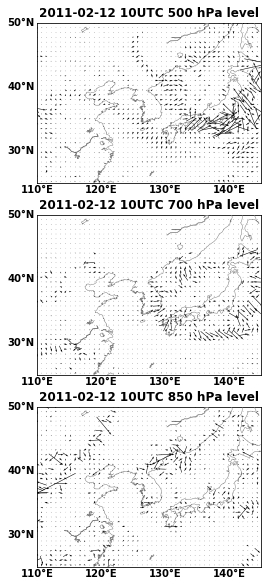

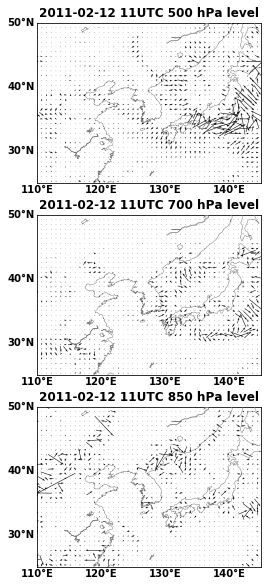

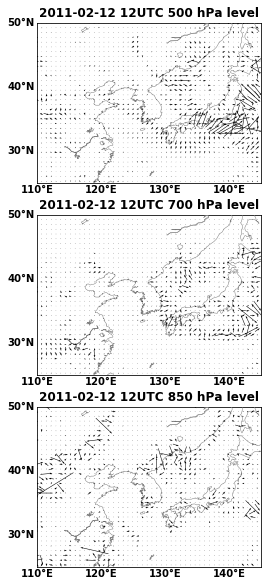

In [15]:
qUs = [qU500, qU700, qU850]
qVs = [qV500, qV700, qV850]

for t, time in tqdm(enumerate(times), total = len(times)):
    fig, subs = plt.subplots(nrows = 3, figsize = (5, 10), sharex = True)
    
    for l, level in enumerate([500, 700, 850]):
        sub = subs[l]
        
        m = Basemap(llcrnrlon = llLon, urcrnrlon = urLon, llcrnrlat = llLat, urcrnrlat = urLat, resolution = "l", ax = sub)
        _ = m.drawcoastlines(linewidth = 0.5, color = "grey", zorder = 5)
        _ = m.drawparallels(np.arange(0.,  90., 10.), labels = [1, 0, 0, 0], linewidth = 0., zorder = 5)
        _ = m.drawmeridians(np.arange(0., 180., 10.), labels = [0, 0, 0, 1], linewidth = 0., zorder = 5)
        
        lats  = ncLats[np.where((ncLats >= llLat) & (ncLats <= urLat))[0]]
        lons  = ncLons[np.where((ncLons >= llLon) & (ncLons <= urLon))[0]]

        meshLons, meshLats = np.meshgrid(lons, lats)
        x, y = m(meshLons, meshLats)
        
        inter = 3
        
        quiver = m.quiver(x[:: inter, :: inter], y[:: inter, :: inter],\
                           qUs[l][t, :: inter, :: inter], qVs[l][t, :: inter, :: inter],\
                           units = "xy", pivot = "mid", scale = 1e-11, zorder = 7)
        
        sub.set_title("%s-%s-%s %sUTC %i hPa level" % (time[: 4], time[4 : 6], time[6 : 8], time[8 :], level))

    plt.savefig("./3/%s.png" % time, dpi = 1000, bbox_inches = "tight")

100%|██████████| 49/49 [00:58<00:00,  1.19s/it]
MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


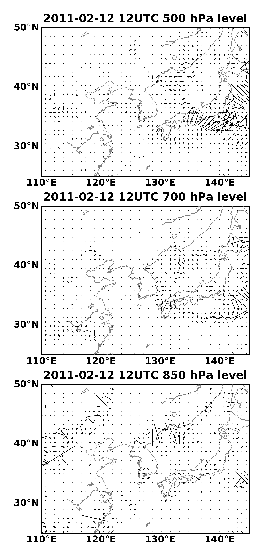

In [16]:
fig, sub = plt.subplots(figsize = (5, 10))
sub.axis("off")

figs = []

for time in tqdm(times, total = len(times)):
    imgplot = plt.imshow(mgimg.imread("./3/%s.png" % time))
    figs.append([imgplot])

anim = ArtistAnimation(fig, figs, interval = 1000, blit = True, repeat_delay = 2000)
anim.save("./3/3.gif", fps = 4, dpi = 1000)